In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
import math
import random

In [2]:
def save_images_to_directory(image_list, directory_path):

    # Ensure the directory exists, and create it if it doesn't
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)

    # Save the specified number of images from the list to the directory
    for i in range(len(image_list)):
        image = image_list[i]
        
        # Ensure that the image data is in uint8 format and that the shape is (height, width, channels)
        if image.dtype != np.uint8:
            image = (255 * image).astype(np.uint8)
        if len(image.shape) == 2:
            image = np.stack((image, image, image), axis=-1)

        image_pil = Image.fromarray(image)  # Convert to PIL Image
        image_pil.save(os.path.join(directory_path, f"image_{i:05d}.png"))

In [3]:
def apply_to(set, function, *param):
    new_set = []

    for s in set:
        new_set += function(s, *param)

    set += new_set

    return set

In [4]:
def display_images(image_list, maxx=1000):
    """
    Display a list of images in a grid with automatically calculated rows and columns.

    Parameters:
    - image_list: List of images (numpy arrays) to display.

    Example:
    display_images([image1, image2, image3, image4, image5, image6, image7, image8, image9, image10])
    """
    num_images = len(image_list)
    if num_images > maxx:
        num_images = maxx
    side_length = int(math.ceil(math.sqrt(num_images)))  # Calculate the square root and round up

    rows = side_length
    columns = side_length

    # If the number of images is not a perfect square, adjust the number of rows and columns
    if rows * columns < num_images:
        rows = side_length
        columns = side_length + 1

    # Create a subplot grid with the calculated number of rows and columns
    fig, axes = plt.subplots(rows, columns, figsize=(15, 15))

    for i in range(num_images):
        ax = axes[i // columns, i % columns]
        ax.imshow(image_list[i])
        ax.axis('off')  # Hide axis labels

    # Hide any remaining empty subplots
    for i in range(num_images, rows * columns):
        ax = axes[i // columns, i % columns]
        ax.axis('off')

    plt.show()

In [5]:
def rotate_im(image, number=9):
    if number < 2:
        print("number should be at least 2 in rotate_im function")
        exit(1)
    # create `number` images from the original one

    w = image.shape[0]
    h = image.shape[1]

    angle = 360//number

    res = []

    for current_angle in range(0, 360, angle):
        M = cv2.getRotationMatrix2D((w/2,h/2),current_angle, 1)

        new_image = cv2.warpAffine(image, M, image.shape[:2], borderValue=(1.,1.,1.))

        res.append(new_image)

    return res

In [6]:
def mirror(image):
    return [cv2.flip(image, 1)]

In [7]:
def load_images_from_directory(directory):
    image_list = []
    for filename in os.listdir(directory):
        image_path = os.path.join(directory, filename)
        image = Image.open(image_path)
        image_list.append(image)
    return image_list

In [8]:
directories = ['A/', 'B/', 'C/', 'D/', 'E/', 'F/']
path = "./Training/original/"

image_lists = []

for directory in directories:
    image_list = load_images_from_directory(path + directory)
    image_lists.append(image_list)

In [9]:
print(len(image_list))

124


**Presentation of my screenshots I did on google image + google street view + some of the German dataset**

In [10]:
# for image_list in (image_lists):
#     display_images(image_list)

Create some rules for mirror & rotation:

- A: mirror on *
- B: -
- C: mirror on * & rotate x times on *
- D: mirror on * & rotate 2 times on *
- E: mirror on * & rotate 4 times on *
- F: mirror on M & rotate 2 times on R
  - M:
    - 36
    - 37
    - 38
    - 50
    - 56
    - 57
    - 76
    - 80
    - 82
    - 84
    - 86
    - 93
    - 103
    - 104
    - 106
    - 118
    - 119
    - 120
    - 122
  - R:
    - 37
    - 38
    - 50
    - 56
    - 57
    - 103
    - 104
    - 106
    - 118
    - 119
    - 120
    - 122

Each Image will be resized to `228*228*3`

Mirror & Rotation & resize will be stored in the directory `Aumentation1`

**First, resize all images**

In [11]:
for image_list in image_lists:
    for i in range(len(image_list)):
        img_np = np.array(image_list[i])
        image_list[i] = Image.fromarray(cv2.resize(img_np, (228,228)))

## Work on A

mirror * ; no rotations

**Original datset**

In [12]:
Aug_A = []
for im in image_lists[0]:
    Aug_A.append(np.array(im))

In [13]:
print(np.array(Aug_A).shape)

(27, 228, 228, 3)


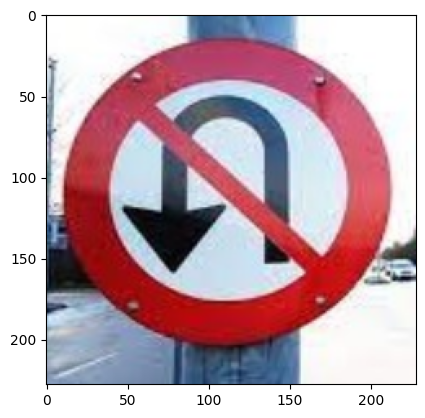

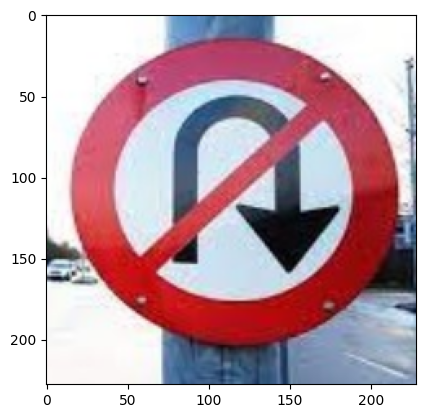

In [14]:
plt.imshow((Aug_A[0]))
plt.show()

plt.imshow(mirror(Aug_A[0])[0])
plt.show()

In [15]:
k = len(Aug_A)
for i in range(k):
    Aug_A.append(mirror(Aug_A[i])[0])

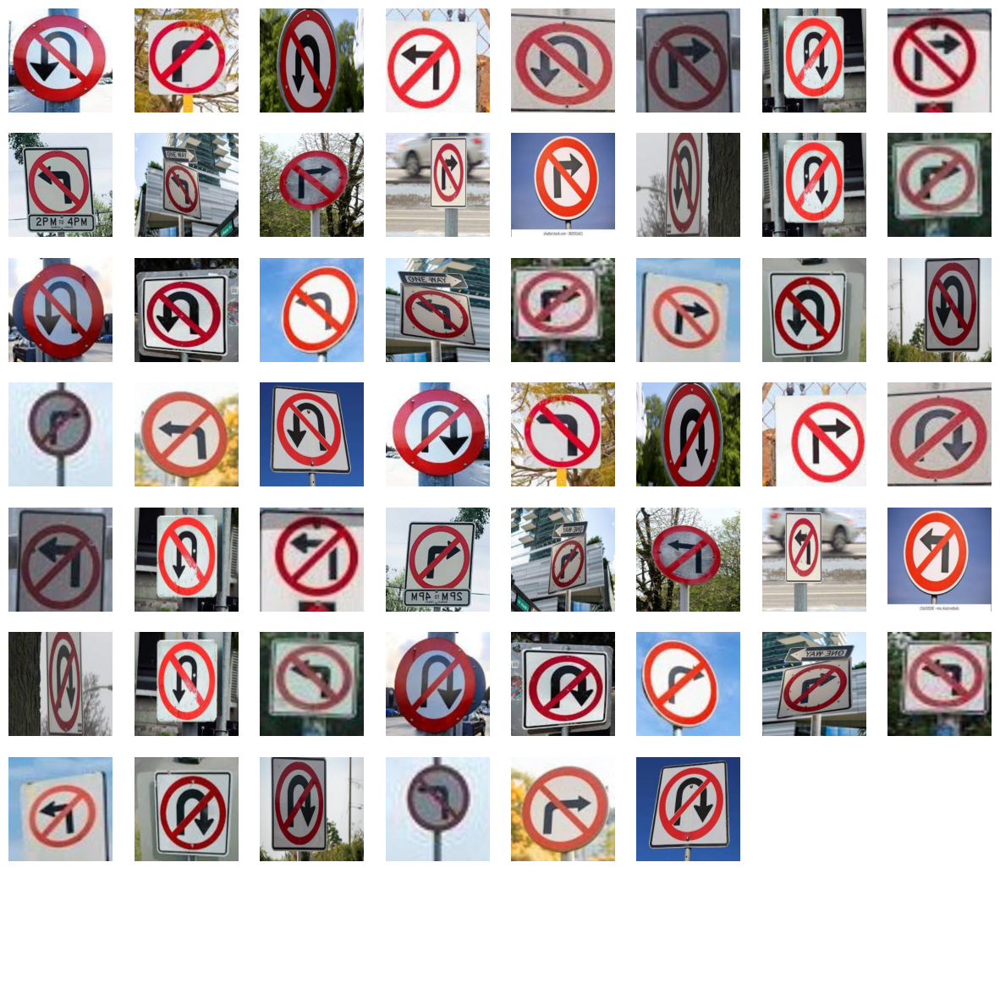

In [16]:
display_images(Aug_A)

**Save in memory**

In [18]:
# save_images_to_directory(Aug_A, './Training/augmentation1/A/')
Aug_A = None

## Work on B

no mirror, no rotations... no work

## Work on C

mirror on * & rotate x times on *

### Mirror

In [23]:
Aug_C = []
for im in image_lists[2]:
    Aug_C.append(np.array(im))

In [24]:
k = len(Aug_C)
for i in range(k):
    Aug_C.append(mirror(Aug_C[i])[0])

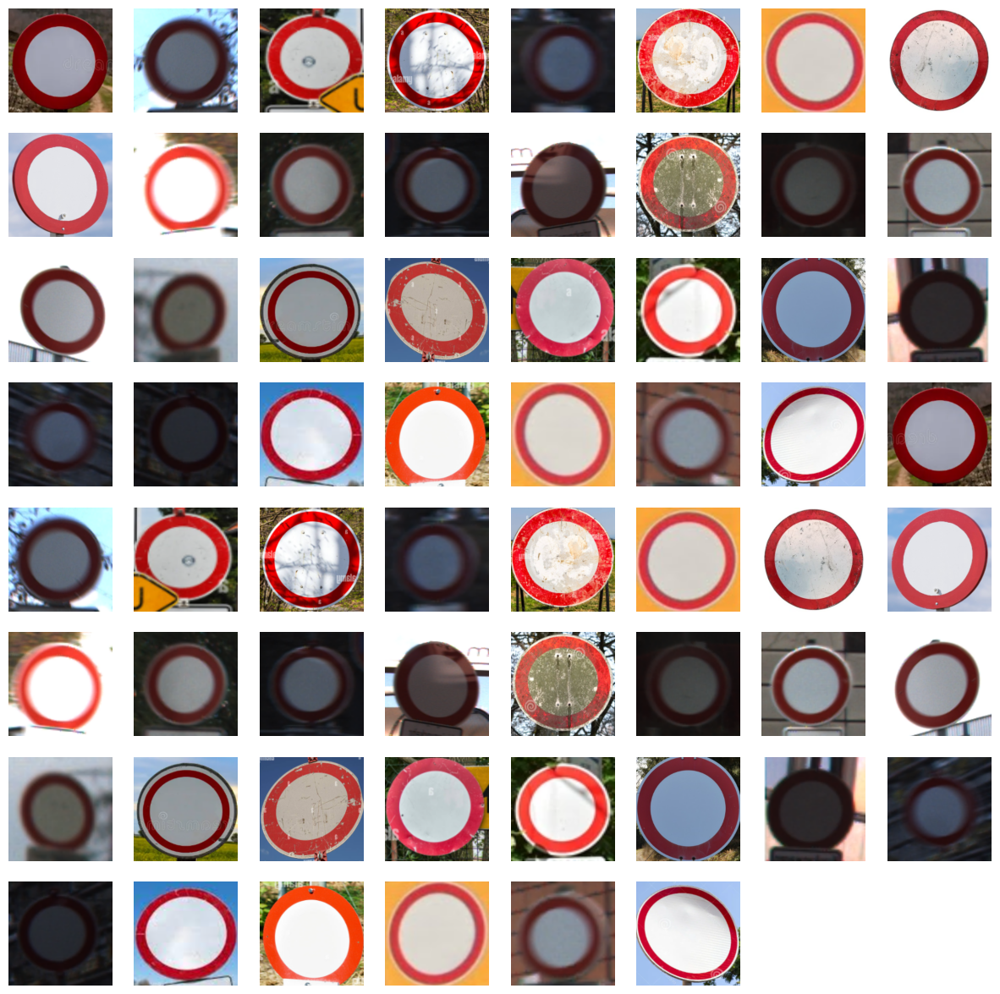

In [25]:
display_images(Aug_C)

### Rotate

**I will rotate 3 times, This factor may be adjusted later depending on the size of datasets A, B, D, E and F**

In [26]:
apply_to(Aug_C, rotate_im, 3)
print("")

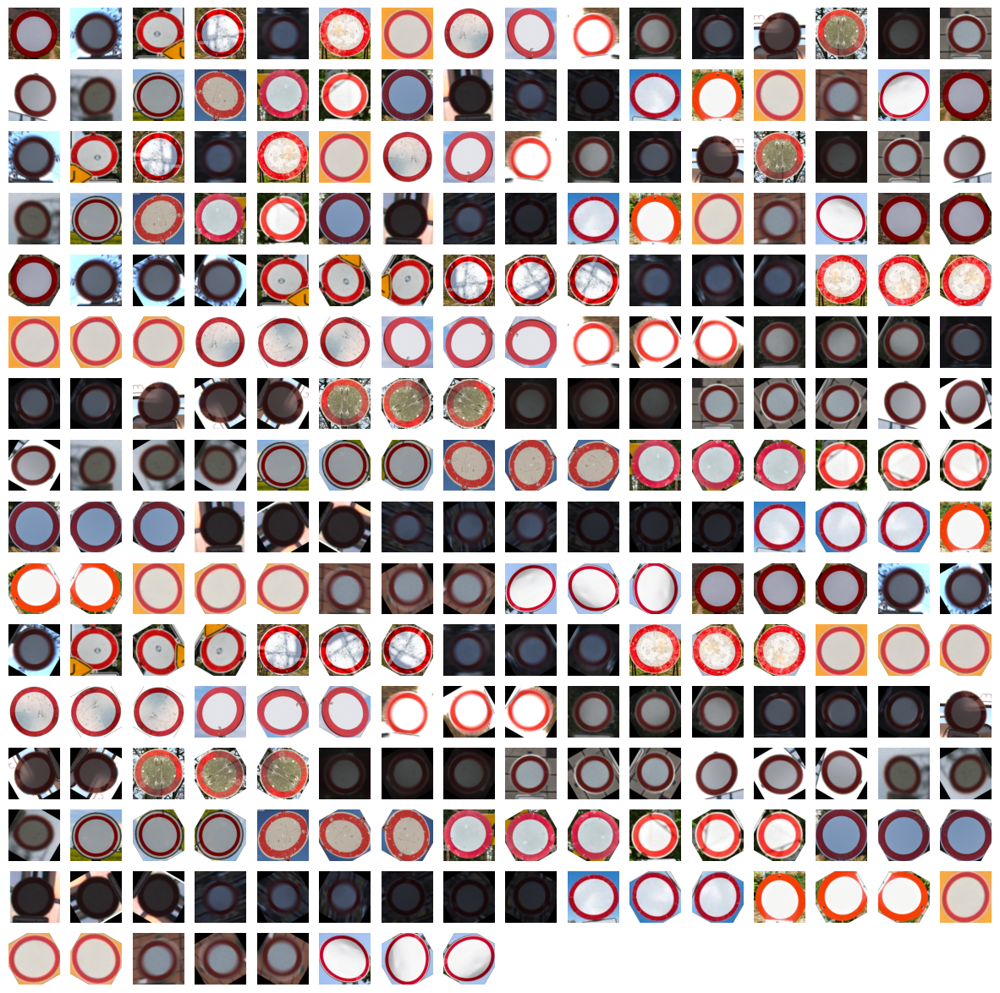

In [27]:
display_images(Aug_C)

**Save to memory**

In [28]:
save_images_to_directory(Aug_C, './Training/augmentation1/C/')
Aug_C = None

## Work on D

mirror on * & rotate 2 times on *

### Mirror

In [29]:
Aug_D = []
for im in image_lists[3]:
    Aug_D.append(np.array(im))

k = len(Aug_D)
for i in range(k):
    Aug_D.append(mirror(Aug_D[i])[0])

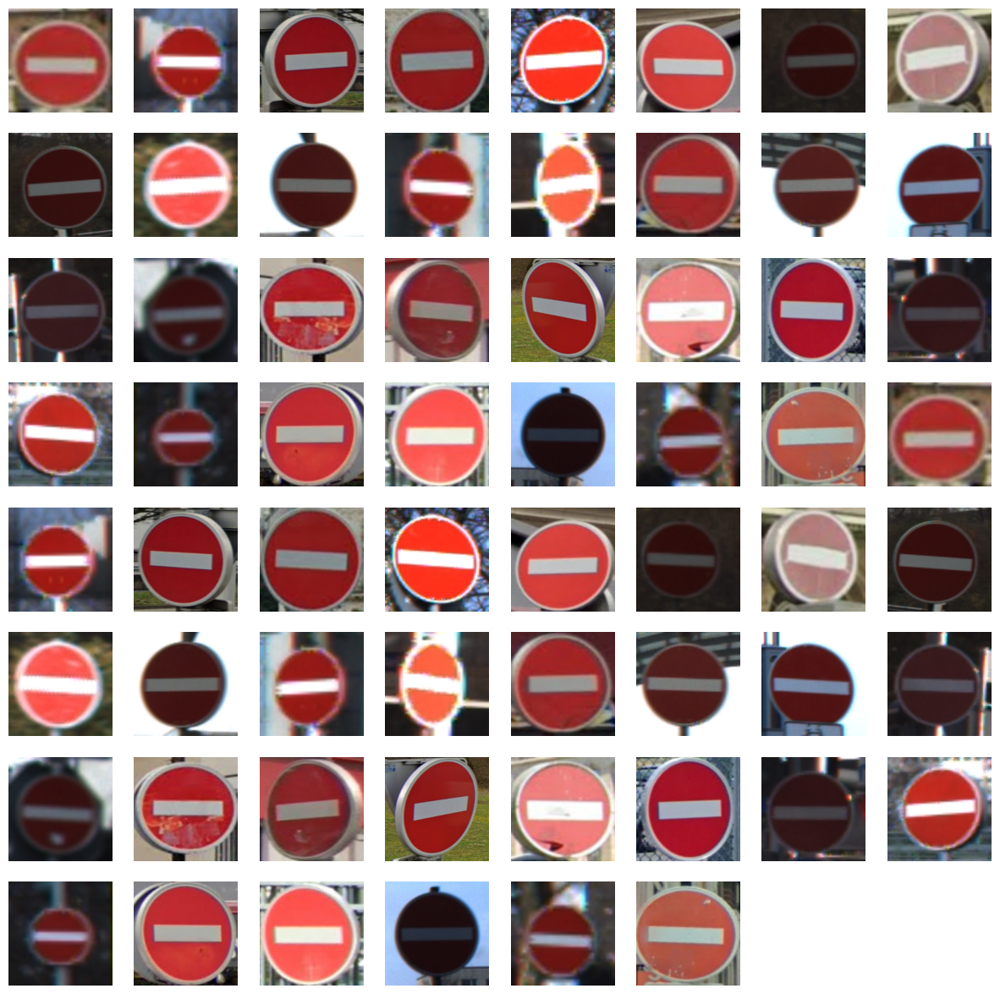

In [31]:
display_images(Aug_D)

### Rotate

In [32]:
apply_to(Aug_D, rotate_im, 2)
print("")

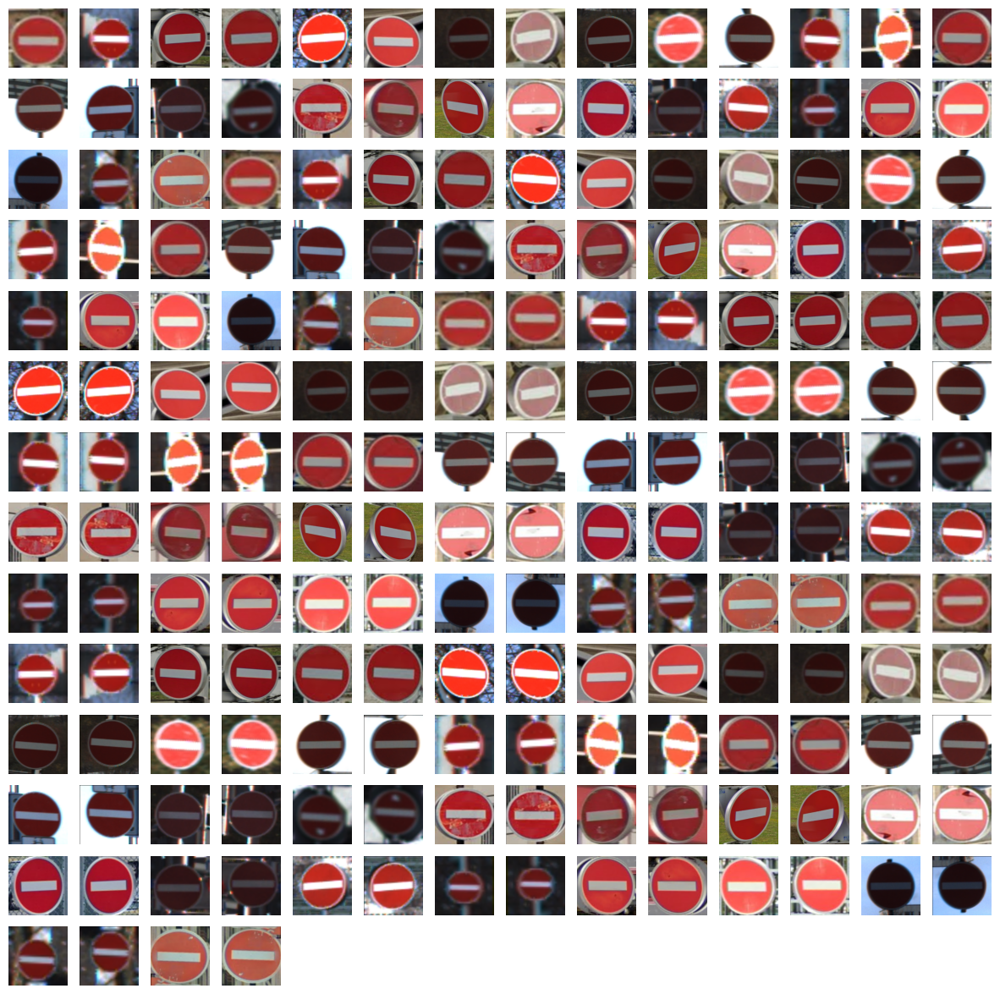

In [33]:
display_images(Aug_D)

**Save to memory**

In [34]:
save_images_to_directory(Aug_D, './Training/augmentation1/D/')
Aug_D = None

## Work on E

mirror on * & rotate 4 times on *

### Mirror

In [35]:
Aug_E = []
for im in image_lists[4]:
    Aug_E.append(np.array(im))

k = len(Aug_E)
for i in range(k):
    Aug_E.append(mirror(Aug_E[i])[0])

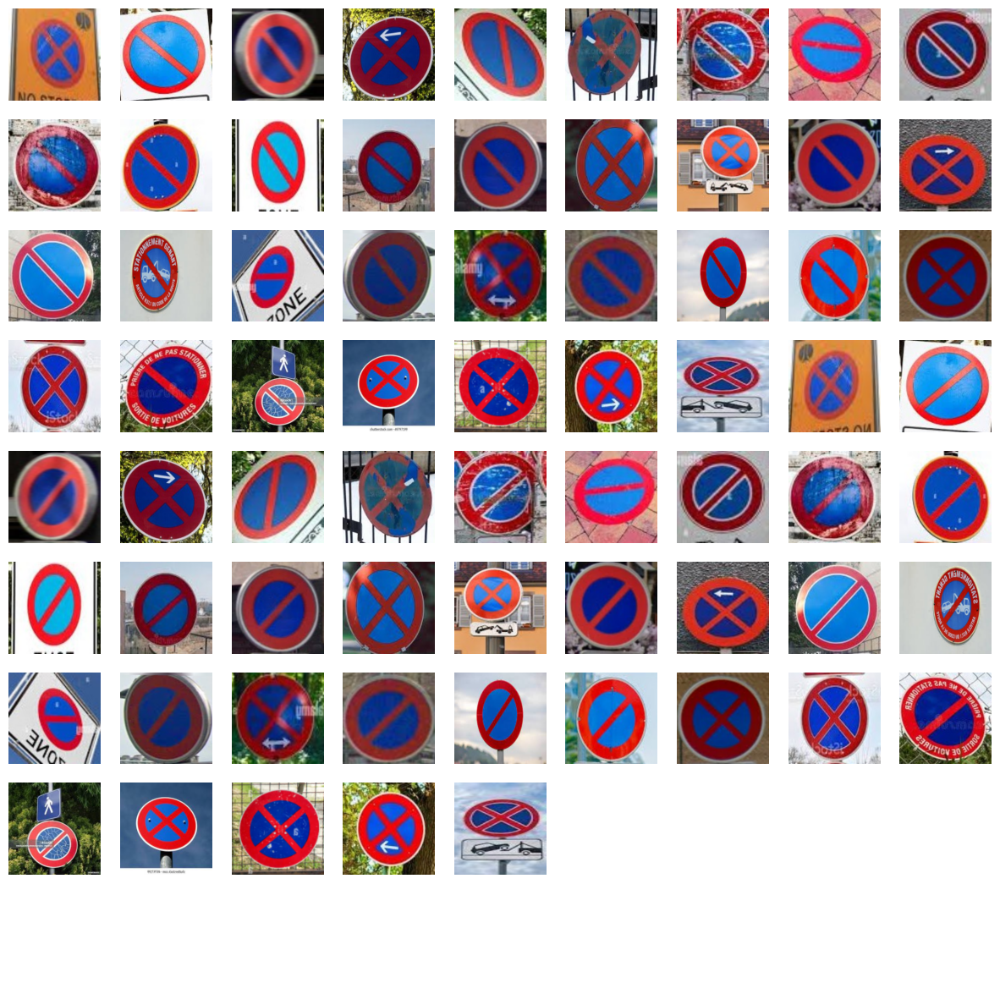

In [36]:
display_images(Aug_E)

### Rotate

In [37]:
apply_to(Aug_E, rotate_im, 4)
print("")

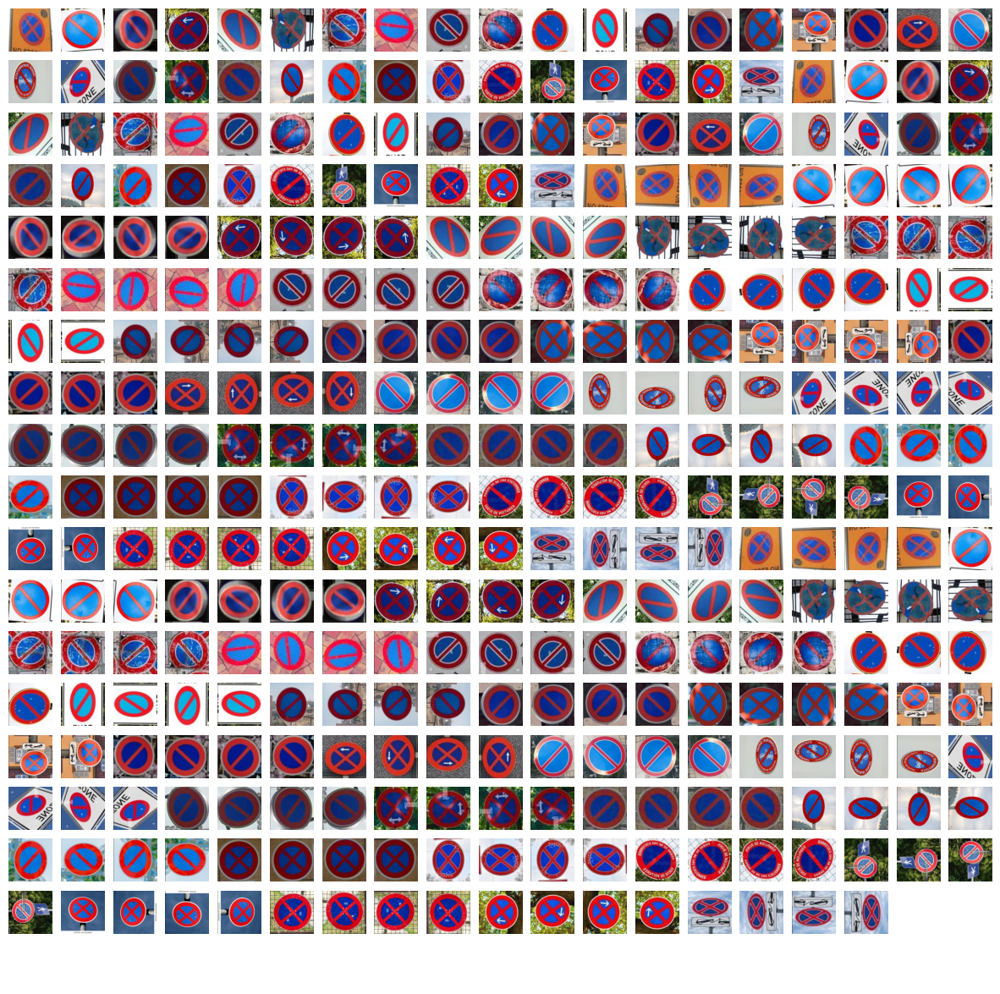

In [38]:
display_images(Aug_E)

**Save to memory**

In [39]:
save_images_to_directory(Aug_E, './Training/augmentation1/E/')
Aug_E = None

## Work on F

mirror on M & rotate 2 times on R
- M:
  - 36
  - 37
  - 38
  - 50
  - 56
  - 57
  - 76
  - 80
  - 82
  - 84
  - 86
  - 93
  - 103
  - 104
  - 106
  - 118
  - 119
  - 120
  - 122
- R:
  - 37
  - 38
  - 50
  - 56
  - 57
  - 103
  - 104
  - 106
  - 118
  - 119
  - 120
  - 122

In [41]:
M = (36, 37, 38, 50, 56, 57, 76, 80, 82, 84, 86, 93, 103, 104, 106, 118, 119, 120, 122)
R = (37, 38, 50, 56, 57, 103, 104, 106, 118, 119, 120, 122)

### Mirror

In [42]:
Aug_F = []
for im in image_lists[5]:
    Aug_F.append(np.array(im))

k = len(Aug_F)
for i in M:                             # Not working, the images are not in the same order
    Aug_F.append(mirror(Aug_F[i])[0])

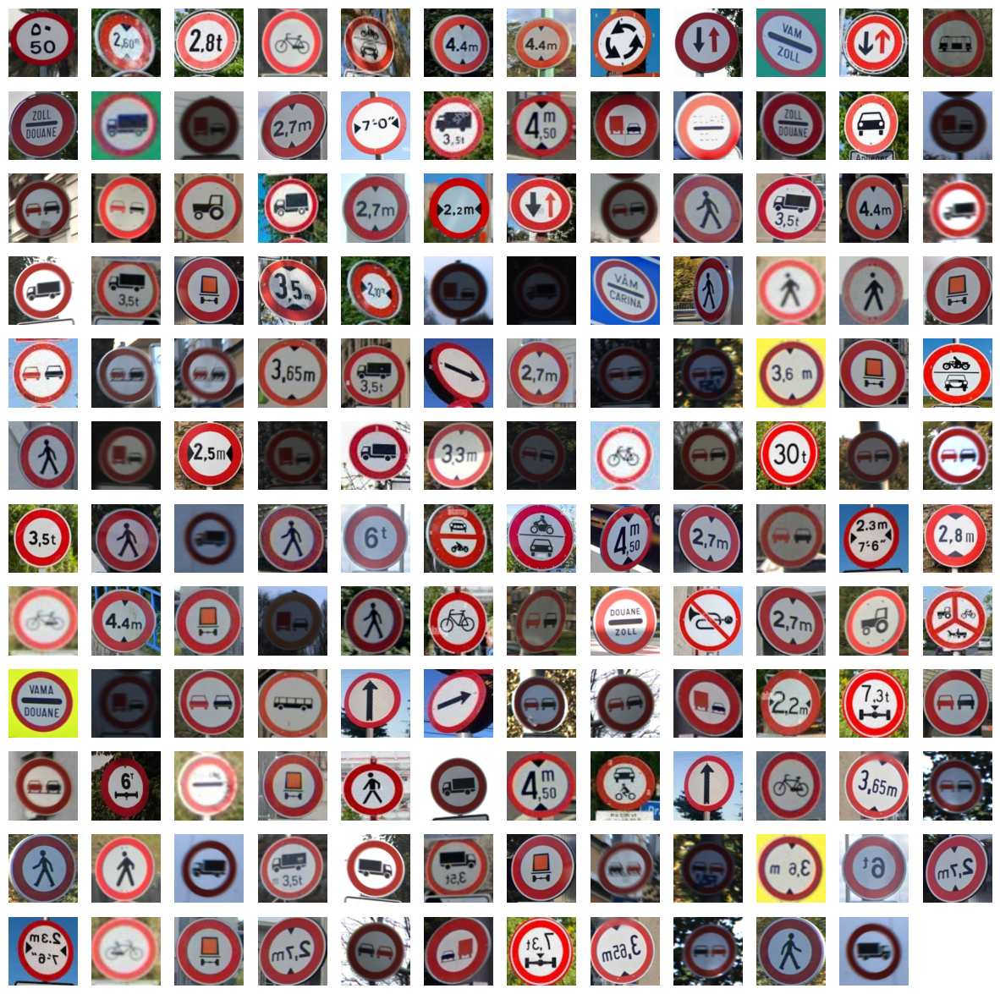

In [43]:
display_images(Aug_F)